In [1]:
import numpy as np
import pandas as pd
import time
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard

2024-07-14 23:49:25.617022: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/ros/noetic/lib
2024-07-14 23:49:25.617044: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
%load_ext tensorboard

In [3]:

%tensorboard --logdir logs/keras_stress --port 6010

In [4]:
def submin_max_scale_subjects(df, columns_to_normalize, subject_column='subject'):
    scaler = MinMaxScaler()
    normalized_data = pd.DataFrame()
    
    for subject, group in df.groupby(subject_column):
        group[columns_to_normalize] = scaler.fit_transform(group[columns_to_normalize])
        normalized_data = pd.concat([normalized_data, group])
    
    return normalized_data

In [5]:

def reshape_row(row):
    electrode_matrix = np.array([
        [0, 0, 0, 'AF3', 0, 0, 'AF4', 0, 0, 0],
        [0, 'F7', 0, 0, 'F3', 'F4', 0, 0, 'F8', 0],
        [0, 0, 'FC5', 0, 0, 0, 0, 'FC6', 0, 0],
        ['T7', 0, 0, 0, 0, 0, 0, 0, 0, 'T8'],
        [0, 0, 'P7', 0, 0, 0, 0, 'P8', 0, 0],
        [0, 0, 0, 0, 'O1', 'O2', 0, 0, 0, 0]
    ])
    # Map each value in the row to the corresponding position in electrode_matrix
    for i, col in enumerate(electrode_matrix.flatten()):
        if col in row.index:
            electrode_matrix[np.where(electrode_matrix == col)] = row[col]

    return electrode_matrix

In [7]:
csv_file_path = '../stew_data.csv'
stew_df = pd.read_csv(csv_file_path)
stew_df = stew_df.sort_values(by='subject', ascending=True)


In [25]:
stew_df.head(2)

,subject,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4,label
614399,1,4645.64,4186.67,4554.87,4450.26,7776.410,3877.95,4216.41,4600.00,4741.03,4325.13,4281.03,4477.44,4615.38,4274.36,0
620797,1,4672.31,3912.31,4611.28,4481.03,620.513,3886.67,4201.54,4636.41,4722.05,4322.05,3950.77,4586.67,4520.00,4323.59,0


In [ ]:
stewcolumns_to_normalize = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']

selected_norm = submin_max_scale_subjects(stew_df , stewcolumns_to_normalize)

selected_features_norm=selected_norm.drop(['subject','label'],axis=1)

selected_labels=stew_df['label']
selected_norm.shape

In [14]:
selected_features_norm.head(2)

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
1311994,0.300357,0.172246,0.470327,0.344843,0.385872,0.545234,0.58249,0.683649,0.602947,0.509360,0.582456,0.521246,0.507752,0.447018
1311995,0.300133,0.188008,0.463822,0.331150,0.398764,0.549007,0.58686,0.681636,0.607437,0.514351,0.583379,0.518417,0.509406,0.455807


# Keras model

In [15]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dropout, Dense, Lambda
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from sklearn.model_selection import train_test_split
import time
from datetime import datetime


def preprocess_3d_data(df, labels):
    transformed_data = np.array([reshape_row(row) for _, row in df.iterrows()])
    data_array = transformed_data.astype(np.float32)
    data_reshaped = np.reshape(data_array, (data_array.shape[0], -1))
    
    # Split into train_val and test sets (with stratification)
    X_train_val, X_test, y_train_val, y_test = train_test_split(data_reshaped, labels, test_size=0.15, random_state=42, stratify=labels)
    
    # Further split train_val into train and validation sets (with stratification)
    X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.176, random_state=42, stratify=y_train_val)
    
    # Reshape data as needed (assuming it's a 3D structure)
    X_train = np.reshape(X_train, (X_train.shape[0], 6, 10))
    X_val = np.reshape(X_val, (X_val.shape[0], 6, 10))
    X_test = np.reshape(X_test, (X_test.shape[0], 6, 10))
    
    return X_train, X_val, X_test, y_train, y_val, y_test

def build_3d_model(input_shape):
    # Define the model
    model_input = Input(shape=input_shape, name='input')
    x = Bidirectional(LSTM(64, return_sequences=True))(model_input)
    x = Dropout(0.2)(x)
    x = Bidirectional(LSTM(32))(x)
    x = Dropout(0.2)(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(32, activation='relu')(x)
    output = Dense(1, activation='sigmoid', name='output')(x)
    thresholded_output = Lambda(lambda x: tf.cast(x > 0.5, tf.float32), name='threshold')(output)
    model = tf.keras.models.Model(inputs=model_input, outputs=[output, thresholded_output])

    model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
    model.summary()
    return model

def train_3d_model(model, X_train, y_train, X_val, y_val, epochs, batch_size, early_stopping_patience):
    callbacks = []
    if early_stopping_patience:
        early_stopping = EarlyStopping(monitor='val_loss', patience=early_stopping_patience, verbose=1)
        callbacks.append(early_stopping)

    tensorboard_callback = TensorBoard(log_dir="./logs/keras_stress/" + time.strftime("%d_%m_%Y-%H_%M_%S"), histogram_freq=1)
    callbacks.append(tensorboard_callback)

    history = model.fit(X_train, [y_train, y_train], epochs=epochs, batch_size=batch_size, validation_data=(X_val, [y_val, y_val]), callbacks=callbacks, verbose=1)
    return history


def evaluate_3d_model(model, X_test, y_test):
    accuracy = model.evaluate(X_test, y_test)
    print(f'Accuracy - Model 3D: {accuracy}')
    return accuracy

In [16]:
import os 
def save_tflite_model(model, directory):
    run_model = tf.function(lambda x: model(x))
    BATCH_SIZE = 1
    STEPS = 6
    INPUT_SIZE = 10
    concrete_func = run_model.get_concrete_function(
        tf.TensorSpec([BATCH_SIZE, STEPS, INPUT_SIZE], model.inputs[0].dtype))

    MODEL_DIR = "stress_keras_lstm_3d"
    model.save(MODEL_DIR, save_format="tf", signatures=concrete_func)

    converter = tf.lite.TFLiteConverter.from_saved_model(MODEL_DIR)
    tflite_model = converter.convert()

    # Get the current date and time with hyphens
    current_datetime = datetime.now().strftime("%H-%M-%S_%d-%m-%Y")
    tflite_model_filename = os.path.join(directory, f"all_stress_model_3d_{current_datetime}.tflite")

    # Ensure the directory exists
    os.makedirs(directory, exist_ok=True)

    # Save the TFLite model
    with open(tflite_model_filename, "wb") as f:
        f.write(tflite_model)
    print(f"Model saved as {tflite_model_filename}")
    return tflite_model_filename

def train_model_with_save(df, labels, epochs, batch_size, early_stopping_patience=10):
    X_train, X_val, X_test, y_train, y_val, y_test = preprocess_3d_data(df, labels)
    
    model_3d = build_3d_model((6, 10))

    history_model_3d = train_3d_model(model_3d, X_train, y_train, X_val, y_val, epochs, batch_size, early_stopping_patience)

    start_time = time.time() 
    accuracy_model_3d = evaluate_3d_model(model_3d, X_test, y_test)
    testing_time = time.time() - start_time
    print(f'Testing Time: {testing_time} seconds')

    # Save the TFLite model in the specified directory
    tflite_model_filename = save_tflite_model(model_3d, "tflite_3d")

    return model_3d,accuracy_model_3d, tflite_model_filename , X_test, y_test

## testing tflite accuracy on test data

In [17]:
import tensorflow as tf
import numpy as np

def test_run_tflite_model(tflite_model_path, X_test, y_test):
    # Load the TFLite model and allocate tensors
    interpreter = tf.lite.Interpreter(model_path=tflite_model_path)
    interpreter.allocate_tensors()

    # Get input and output tensors
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    # Initialize counters for accuracy
    correct_predictions = 0
    total_predictions = len(X_test)

    # Run inference on the test set
    for i in range(total_predictions):
        sample_input = np.expand_dims(X_test[i], axis=0).astype(np.float32)

        # Set the input tensor
        interpreter.set_tensor(input_details[0]['index'], sample_input)

        # Run inference
        interpreter.invoke()

        # Get the output tensor
        output_data = interpreter.get_tensor(output_details[0]['index'])

        # Get the predicted label
        predicted_label = np.argmax(output_data)

        # Get the actual label
        if isinstance(y_test, np.ndarray) or isinstance(y_test, list):
            actual_label = np.argmax(y_test[i])
        else:
            actual_label = np.argmax(y_test.iloc[i])

        # Print the data, predicted label, and actual label
        # print(f"Data: {sample_input}")
        print(f"Predicted label: {predicted_label}, Actual label: {actual_label}")

        # Check if the prediction is correct
        if predicted_label == actual_label:
            correct_predictions += 1

    # Calculate accuracy
    accuracy = correct_predictions / total_predictions
    print(f"Accuracy: {accuracy * 100:.2f}%")

In [18]:
def save_model(model, directory, model_name):
    # Ensure the directory exists
    os.makedirs(directory, exist_ok=True)
    
    # Save the model
    model_path = os.path.join(directory, model_name)
    model.save(model_path)
    print(f"Model saved as {model_path}")
    return model_path

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def evaluate_saved_model(model, X_test, y_test):
    # Predict the labels for the test set
    y_pred = model.predict(X_test)

    # Convert y_pred to a numpy array if it's a list
    if isinstance(y_pred, list):
        y_pred = np.array(y_pred)

    print(y_pred.shape)

    # Extract predicted labels by taking the argmax across the first axis
    y_pred_labels = np.argmax(y_pred, axis=0).flatten()

    # Ensure y_pred_labels and y_test have the same number of samples
    if y_pred_labels.shape[0] != y_test.shape[0]:
        raise ValueError(f"Mismatch in number of samples: y_pred has {y_pred_labels.shape[0]}, y_test has {y_test.shape[0]}")

    # Initialize counters for accuracy
    correct_predictions = np.sum(y_pred_labels == y_test)
    total_predictions = y_test.shape[0]

    # Calculate accuracy
    accuracy = correct_predictions / total_predictions
    print(f"Accuracy: {accuracy * 100:.2f}%")

    # Compute the confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_labels)

    # Plot the confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

    return accuracy


## working on whole dataset 

In [ ]:
all_stress_model,all_accuracy_model1,all_tflite_model_filename , all_X_test, all_y_test = train_model_with_save(stew_norm,
stew_labels, epochs=25, batch_size=32, 
    early_stopping_patience=2
)

In [ ]:
test_run_tflite_model(all_tflite_model_filename , all_X_test, all_y_test)

In [ ]:
accuracy = evaluate_saved_model(all_tflite_model_filename , all_X_test, all_y_test)

In [ ]:
al_model_path = save_model(all_stress_model, "saved_models", "stra_all_stress_model_3d.h5")

Model saved as saved_models/all_stress_model_3d.h5


(2, 276480, 1)
Accuracy: 88.16%


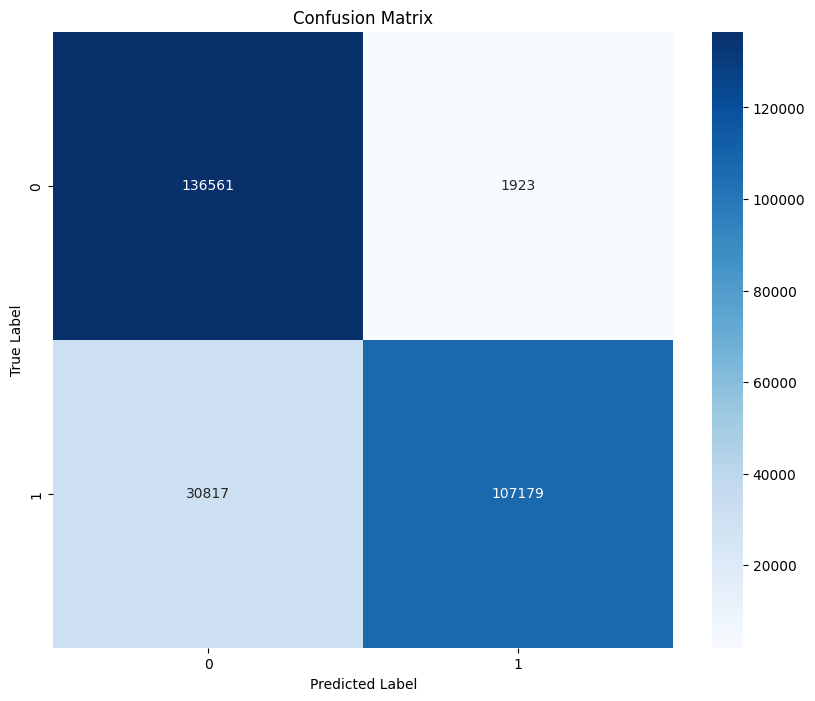

In [21]:
accuracy = evaluate_saved_model(all_stress_model,all_X_test, all_y_test )

In [27]:
test_run_tflite_model(all_tflite_model_filename , all_X_test, all_y_test)

Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual label: 0
Predicted label: 0, Actual l